# 04 - Evaluating Predictions of Network Submitted to the SnakeCLEF 2021 Challenge

In [1]:
%load_ext pycodestyle_magic
%pycodestyle_on

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
from fastai.vision.all import (Normalize, ToTensor, Resize,
                               Learner, CSVLogger, SaveModelCallback)

from src.core import models, metrics, data
from src.utils import nb_setup, io, visualization as viz
from src.dev import experiments as exp, evaluation


DATA_DIR = 'data/snake_clef2021_dataset/'
TRAIN_SET_DIR = 'train'
TEST_SET_DIR = 'test'

SEED = 42

nb_setup.init()
nb_setup.set_random_seed(SEED)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Device: cuda


## Select Training Configuration (network architecture, loss, optimizer, ...)

In [3]:
OUTPUT_DIR = 'output/'
SPECS_PATH = 'training_history/submission_runs/'
RUN_ID, SPECS_FILE = 1, SPECS_PATH + 'clef2021_resnest200_ce_05-11-2021_13-24.json'
# RUN_ID, SPECS_FILE = 2, SPECS_PATH + 'clef2021_resnest200_ce_05-15-2021_08-42.json'
# RUN_ID, SPECS_FILE = 3, SPECS_PATH + 'clef2021_resnet101_ce_04-24-2021_14-07.json'
# RUN_ID, SPECS_FILE = 4, SPECS_PATH + 'clef2021_resnext101_ce_04-29-2021_07-36.json'
# runs 5 and 6 are ensemble models computed in notebook 03b
# RUN_ID, SPECS_FILE = 7, SPECS_PATH + 'clef2021_resnest101_ce_05-10-2021_15-32.json'

config = exp.Config(DATA_DIR + SPECS_FILE)
_model_config = models.get_model_config(config.model)
config['model_mean'] = _model_config['mean']
config['model_std'] = _model_config['std']
config.save(DATA_DIR + SPECS_FILE)
print(config)

Config(
* model_file: clef2021_resnest200_ce_05-11-2021_13-24.pth
* history_file: clef2021_resnest200_ce_05-11-2021_13-24.csv
* no_epochs: 60
* model: resnest200
* loss: ce
* opt: sgd
* input_size: 320
* batch_size: 64
* full_ds: True
* aug: False
* scheduler: False
* learning_rate: 0.1
* model_mean: (0.485, 0.456, 0.406)
* model_std: (0.229, 0.224, 0.225))


## Load the Data

In [6]:
# load metadata
train_df = pd.read_csv(DATA_DIR + 'SnakeCLEF2021_train_metadata_PROD.csv')

# remove flickr images as they are not validated
train_df = train_df[train_df['source'] != 'flickr']
train_df = data.get_valid_col(train_df, ['binomial', 'country'], 'valid', valid_pct=0.1)

no_classes = len(train_df['binomial'].drop_duplicates())
print('No classes:', no_classes)

No classes: 768


In [7]:
species = np.unique(train_df['binomial'])
countries = np.unique(train_df['country'])

# load country-species map, country-country LuT and rename countries
country_map_df = pd.read_csv(DATA_DIR + 'species_to_country_mapping.csv', index_col=0)
country_country_lut = (pd.read_csv(DATA_DIR + 'country_lut.csv')
                       .drop_duplicates('b').set_index('b')['a'].to_dict())
_country_map_df = country_map_df.rename(columns=country_country_lut)

# create country weight matrix
country_weights = metrics.clean_country_map(country_map_df, species, missing_val=0)
country_weights = torch.Tensor(country_weights.values).to(device)

# create country weight matrix with only species and countries available in dls
country_weights_adj = metrics.clean_country_map(
    _country_map_df, species, countries, missing_val=1)
country_weights_adj = torch.Tensor(country_weights_adj.values).to(device)

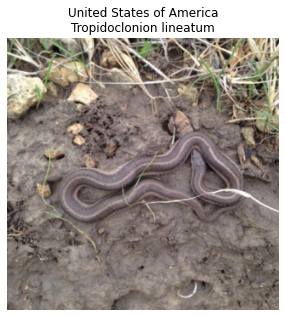

In [11]:
# define transforms
item_tfms = [ToTensor, Resize(config.input_size)]
batch_tfms = Normalize.from_stats(config.model_mean, config.model_std)

# create image data loaders
dls, dblock = data.create_country_dls(
    train_df, path=DATA_DIR, folder=TRAIN_SET_DIR,
    fn_col='image_path', country_col='country',
    label_col='binomial', valid_col='valid',
    bs=config.batch_size, item_tfms=item_tfms, batch_tfms=batch_tfms,
    num_workers=4, device=device)

dls.show_batch(max_n=1)

## Create fastai Learner

In [12]:
from src.core import country_pipeline

learner = Learner(
    dls,
    model=country_pipeline.create_model(config.model, no_classes, pretrained=False,
                                        use_fastai_cnn=True),
    loss_func=country_pipeline.CrossEntropyLoss(country_weights_adj, apply_adjustment=True),
    metrics=country_pipeline.wrap_metrics([
        metrics.pytorch.accuracy,
        metrics.pytorch.F1Score(),
        metrics.pytorch.CountryF1Score(country_weights)], country_weights_adj))
learner.load(config.model_file.replace('.pth', ''))

/home/chamirai/.local/lib/python3.7/site-packages/fastai/learner.py:56: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


## Evaluate metrics on Validation Set

In [13]:
# evaluate results
out = learner.validate(dl=dls.valid)
pd.Series(out, index=['valid_loss', 'accuracy', 'f1_score', 'country_f1_score'])

valid_loss          1.140468
accuracy            0.790340
f1_score            0.636531
country_f1_score    0.697103
dtype: float64

In [14]:
# create predictions
preds, targs = learner.get_preds(dl=dls.valid)
assert np.allclose(preds.sum(1), 1)

In [20]:
# create evaluation dataframe
preds_np = preds.argmax(1).cpu().numpy()
targs_np = targs.cpu().numpy()

eval_df = evaluation.create_eval_df(
    preds_np, targs_np, train_df, vocab=dls.vocab[1],
    label_col='binomial', xtra_cols=['family', 'genus'])
eval_df['country'] = train_df['country'].iloc[dls.valid.get_idxs()]

eval_df.head(5)

,preds,targs,binomial_preds,family_preds,genus_preds,binomial_targs,family_targs,genus_targs,country
0,340,340,Indotyphlops braminus,Typhlopidae,Indotyphlops,Indotyphlops braminus,Typhlopidae,Indotyphlops,United States of America
1,594,594,Ptyas mucosa,Colubridae,Ptyas,Ptyas mucosa,Colubridae,Ptyas,United States of America
2,537,537,Philothamnus semivariegatus,Colubridae,Philothamnus,Philothamnus semivariegatus,Colubridae,Philothamnus,United States of America
3,116,116,Cerastes vipera,Viperidae,Cerastes,Cerastes vipera,Viperidae,Cerastes,United States of America
4,321,233,Hierophis viridiflavus,Colubridae,Hierophis,Dolichophis jugularis,Colubridae,Dolichophis,Russia


### Create Classification Report on Family Level

In [21]:
evaluation.classification_report(eval_df['family_preds'], eval_df['family_targs'])

,precision,recall,f1-score,support
Acrochordidae,1.000000,0.857143,0.923077,7.000000
Aniliidae,1.000000,0.666667,0.800000,6.000000
Boidae,0.933333,0.911628,0.922353,645.000000
Colubridae,0.975355,0.981976,0.978654,25189.000000
Cylindrophiidae,1.000000,0.400000,0.571429,5.000000
Elapidae,0.907293,0.890777,0.898959,824.000000
Homalopsidae,0.850000,0.723404,0.781609,47.000000
Lamprophiidae,0.887006,0.801020,0.841823,392.000000
Leptotyphlopidae,0.944954,0.768657,0.847737,134.000000
Loxocemidae,0.833333,0.833333,0.833333,6.000000


### Create Classification Report on Genus Level

In [22]:
evaluation.classification_report(eval_df['genus_preds'], eval_df['genus_targs'])

,precision,recall,f1-score,support
Acanthophis,0.750000,0.750000,0.750000,8.000000
Achalinus,1.000000,0.714286,0.833333,7.000000
Acrantophis,0.800000,0.800000,0.800000,5.000000
Acrochordus,1.000000,0.857143,0.923077,7.000000
Adelphicos,0.500000,0.500000,0.500000,2.000000
...,...,...,...,...
Xerotyphlops,1.000000,0.888889,0.941176,9.000000
Zamenis,0.871508,0.847826,0.859504,184.000000
accuracy,0.885308,0.885308,0.885308,0.885308
macro avg,0.803463,0.711790,0.736870,33664.000000


### Create Classification Report on Species Level

In [23]:
evaluation.classification_report(eval_df['binomial_preds'], eval_df['binomial_targs'])

,precision,recall,f1-score,support
Acanthophis antarcticus,0.375000,0.750000,0.500000,4.00000
Acanthophis praelongus,0.000000,0.000000,0.000000,1.00000
Acanthophis pyrrhus,0.000000,0.000000,0.000000,1.00000
Acanthophis rugosus,0.000000,0.000000,0.000000,1.00000
Acanthophis wellsi,0.000000,0.000000,0.000000,1.00000
...,...,...,...,...
Zamenis scalaris,0.931818,0.872340,0.901099,47.00000
Zamenis situla,1.000000,0.857143,0.923077,7.00000
accuracy,0.790340,0.790340,0.790340,0.79034
macro avg,0.722291,0.609188,0.636531,33664.00000


## Examples of Correct and Incorrect Predictions

In [39]:
def save_image(dl, img_id, filename, color=None):
    img_id = int(img_id)
    img, country_id, trg_id = dl.dataset[img_id]
    country = dl.vocab[0][country_id]
    trg = dl.vocab[1][trg_id]

    fig, ax = viz.create_fig()
    ax.imshow(img)  # aspect='auto'
    ax.set_title(f'{trg}\n{country}', color=color, fontsize=14)
    ax.axis('off')
    fig.savefig(filename)
    plt.clf()


def plot_images(dl, img_ids, conf, color=None):
    img_ids = np.array(img_ids)
    fig, axs = viz.create_fig(ncols=3, ntotal=len(img_ids))

    for img_id, c, ax in zip(img_ids, conf, axs):
        img, country_id, trg_id = dl.dataset[img_id]
        country = dl.vocab[0][country_id]
        trg = dl.vocab[1][trg_id]

        ax.imshow(img)  # aspect='auto'
        ax.set_title(f'{trg} ({c:.1%})\n{country}', color=color, fontsize=14)
        ax.axis('off')

### Correct Predictions with High Confidence

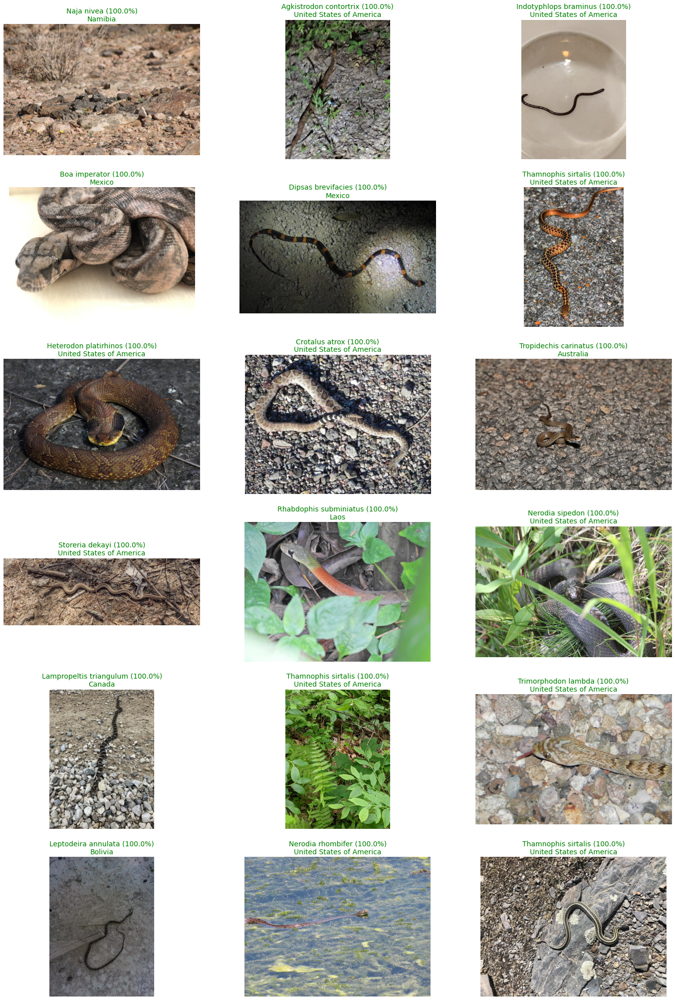

In [40]:
conf, pred_ids = preds.max(1)
best_conf, img_ids = conf[pred_ids == targs].topk(18)

plot_images(dls.valid, img_ids, best_conf, color='green')

### Correct Predictions with Low Confidence

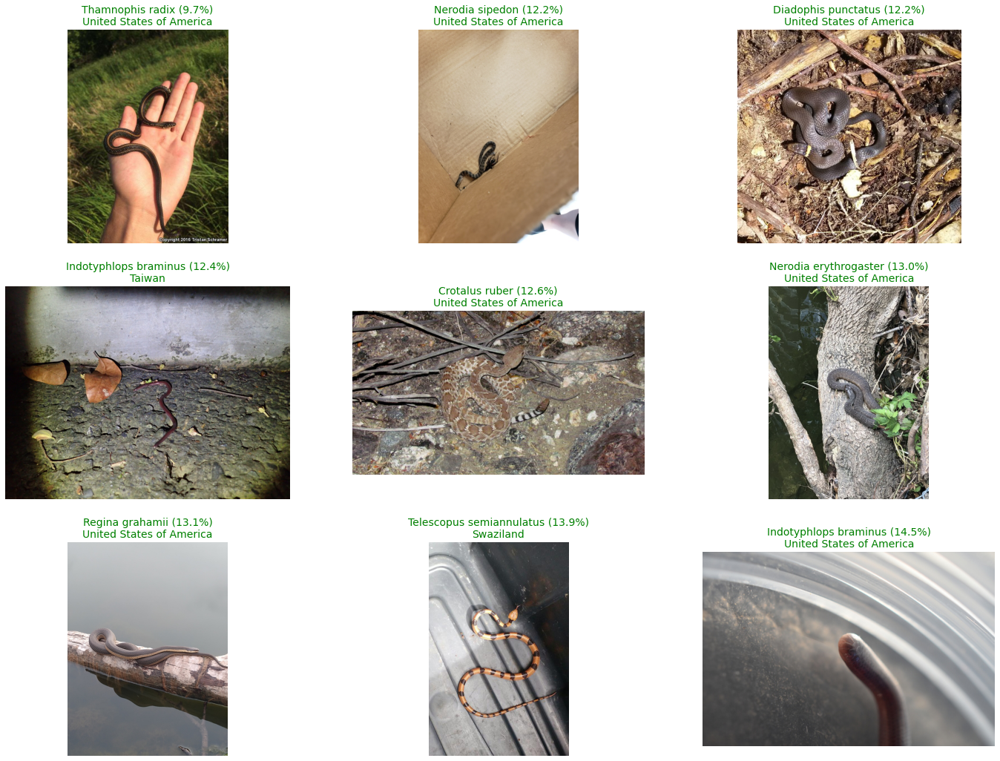

In [41]:
conf, pred_ids = preds.max(1)
best_conf, img_ids = conf[pred_ids == targs].topk(9, largest=False)

plot_images(dls.valid, img_ids, best_conf, color='green')

### Top2 Correct Predictions with High Confidence

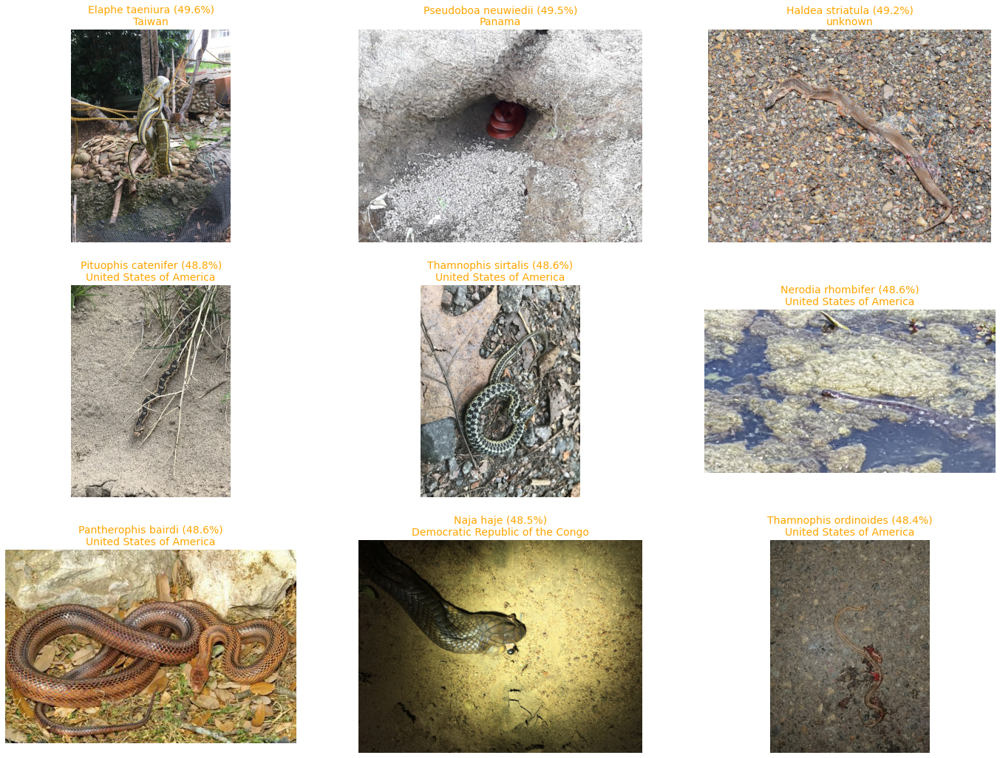

In [46]:
conf, pred_ids = preds.topk(2, 1)
conf, pred_ids = conf[:, 1], pred_ids[:, 1]

best_conf, img_ids = conf[pred_ids == targs].topk(9, largest=True)

plot_images(dls.valid, img_ids, best_conf, color='orange')

### Incorrect Predictions

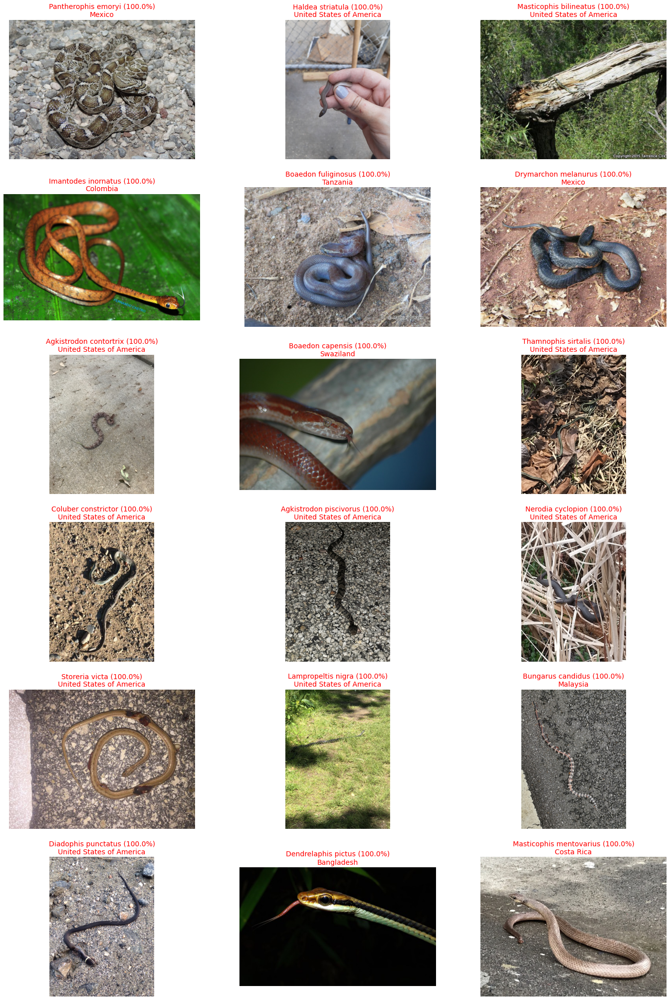

In [47]:
conf, pred_ids = preds.max(1)
best_conf, img_ids = conf[pred_ids != targs].topk(18, largest=True)

plot_images(dls.valid, img_ids, best_conf, color='red')